# PRETRAITEMENT

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib as pl
from google.colab.patches import cv2_imshow

(412, 550, 3)


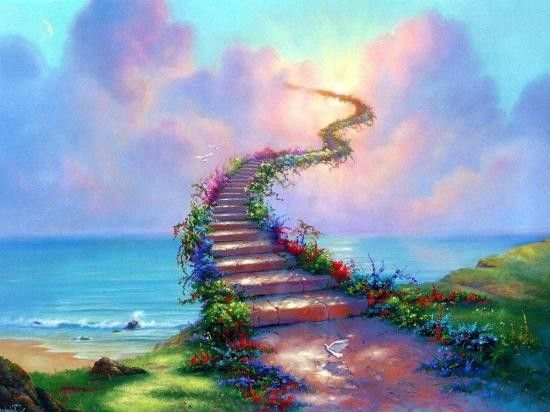

In [ ]:
image=cv.imread("/content/ex1.jpg",1)
print(image.shape)
cv2_imshow(image)

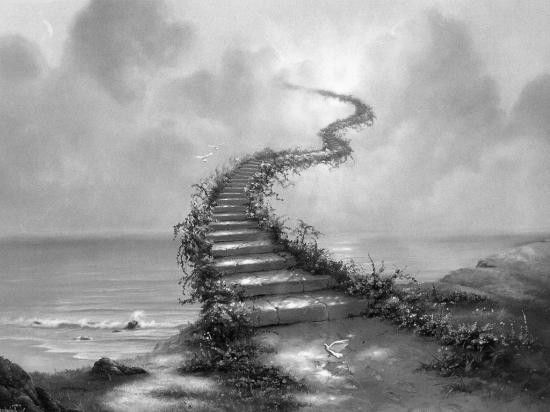

shape (412, 550)


In [ ]:
imggray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
#mt.pyplot.imshow(imggray)
cv2_imshow(imggray)

print("shape",imggray.shape)

In [ ]:
imggray.shape[0]
h = np.zeros(256, int)
h[0]

0

In [ ]:
def histt(im):
  h = np.zeros(256, int)
  for i in range(0,im.shape[0]):
    for j in range(0,im.shape[1]):
      h[im[i][j]]=h[im[i][j]]+1
  return h


In [ ]:
def histtnorm(im):
  return histt(im)/(imggray.shape[0]*imggray.shape[1])

In [ ]:
def denNorm(hn,i):
  #hn=histtnorm(imggray)
  dp=0
  for j in range(0,i+1):
    dp=dp+hn[j]
  return dp

In [ ]:
A=np.copy(imggray)
A

array([[221, 221, 221, ..., 200, 200, 196],
       [221, 221, 221, ..., 196, 196, 192],
       [221, 221, 221, ..., 199, 199, 196],
       ...,
       [ 97,  51,  72, ...,  66,  67,  70],
       [ 92,  47,  75, ...,  66,  66,  70],
       [103,  53,  80, ...,  65,  67,  72]], dtype=uint8)

In [ ]:
def contrast(img):
  A=np.copy(img)
  hn=histtnorm(img)
  for i in range(0,img.shape[0]):
    for j in range(0,img.shape[1]):
      A[i][j]=denNorm(hn,A[i][j])*255
  return A

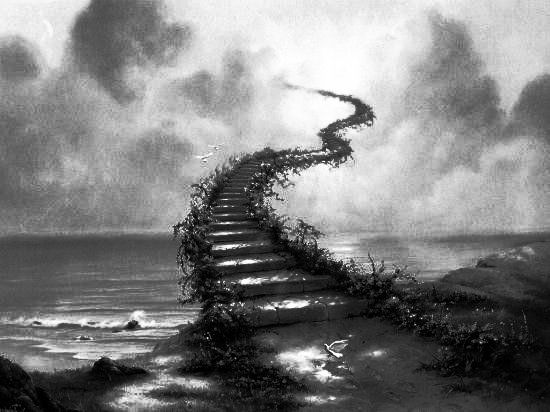

In [ ]:
r=contrast(imggray)
cv2_imshow(r)

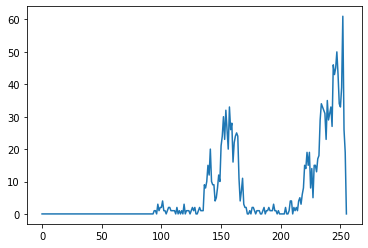

In [ ]:
dst=cv.equalizeHist(imggray)
calchist=cv.calcHist(image,[2],None,[256],[0,255])
pl.pyplot.plot(calchist)
#cv2_imshow(dst)
#pl.pyplot.hist(dst)

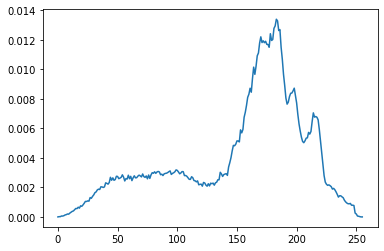

In [ ]:
x=np.arange(0,255,dtype=int)
#img.value_counts().plot.hist()
imagee=histt(imggray)
imageenomr=histtnorm(imggray)
#pl.pyplot.plot(x,imageenomr)
pl.pyplot.plot(imageenomr)

# ***2 eme methode python***

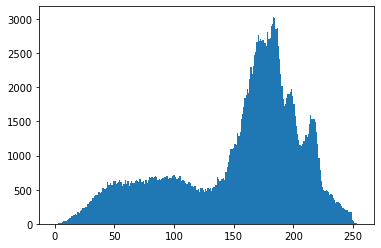

In [ ]:
from PIL import Image,ImageEnhance
imgp = np.array(Image.open('ex1.jpg'))
n, bins, patches = pl.pyplot.hist(imggray.flatten(), bins=range(256))
pl.pyplot.show()


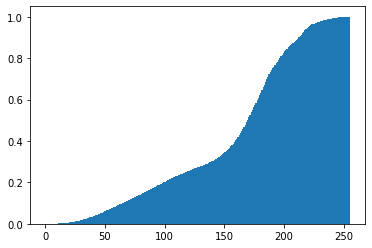

In [ ]:
nr =np.random.normal(0, 1, imggray.shape)
n, bins, patches = pl.pyplot.hist(imggray.flatten(), bins=range(256),density=True,cumulative=True)
pl.pyplot.show()

taille d'image (512, 512)


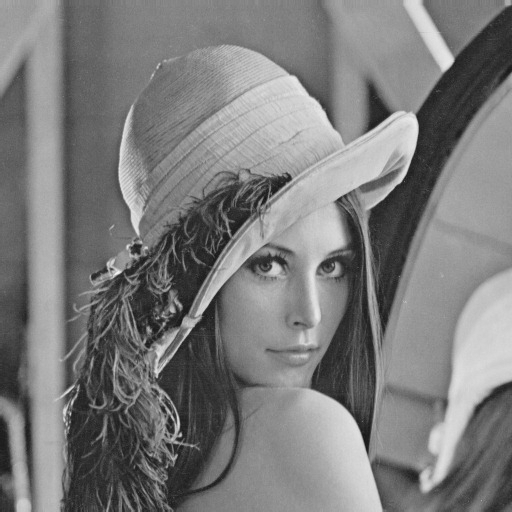

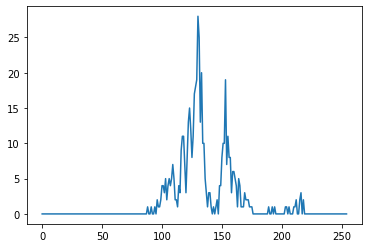

In [ ]:
from PIL import Image
I = cv.imread("lena.jpg",0)
print("taille d'image",I.shape)
im=np.zeros((500,500),np.uint8)
cv.rectangle(im,(0,255),(500,500),(211),-1)
cv.rectangle(im,(0,122),(255,255),(127),-1)
#-----------------------------------------------
cv2_imshow(I)
"""
b,g,r=cv.split(I)
cv2_imshow(b)
cv2_imshow(g)
cv2_imshow(r)

pl.pyplot.hist(I.ravel(),255,[0,255])
pl.pyplot.hist(b.ravel(),255,[0,255])
pl.pyplot.hist(g.ravel(),255,[0,255])
pl.pyplot.hist(r.ravel(),255,[0,255])"""
hist=cv.calcHist(I,[0],None,[255],[0,256])
pl.pyplot.show()

# FILTRAGE

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib as pl
from google.colab.patches import cv2_imshow

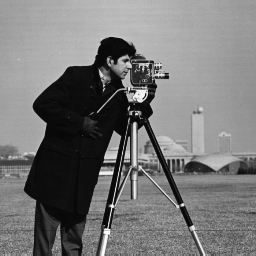

In [ ]:
image=cv.imread("cameraman.tif")
cv2_imshow(image)

In [ ]:
def gauss_Bruit(img, moyenne, sd):
  #n,m,c = img.shape
  n=image.shape[0]
  m=image.shape[1]
  c=image.shape[2]
  mg=np.random.normal(moyenne,sd,(n,m,c)).astype('uint8')
  #cv.add(img,mg)
  return cv.add(img,mg)

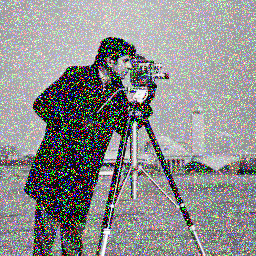

True

In [ ]:
gb=gauss_Bruit(image,0,1)
cv2_imshow(gb)
cv.imwrite('cameraman2.tif',gb)

In [ ]:
h= np.ones((3,3),np.float32)/9
def filtre_Moy(image, size=(3,3)):
  d=size[0]
  im=image.copy()
  kernel = np.ones((d,d),np.float32)/9
  v= int((d-1)/2)
  s=0
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      s=0
      for n in range(-v,v+1):
        for m in range(-v,v+1):
         if (i-n<im.shape[0] and j-m<im.shape[1]):
          s=s+im[i-n][j-m]*kernel[n][m]
          im[i][j]=s
  return im

In [ ]:
def filtre_Moyv1(img):
  imgout=img.copy()
  h=np.one(3,3)
  ms=h/gb.mean()
  s=0
  moyenne=0
  for i in range(0,img.shape[0]):
    for j in range(0,img.shape[1]):
      for f in range(0,9):
        s=s+h[i][j]*img[i-m][j-n]
        img[i][j]=s
  return s

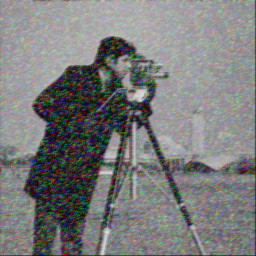

In [ ]:
fm=filtre_Moy(gb,(3,3))
cv2_imshow(fm)

i avant (256, 256, 3)
i apres (256, 256)
(3, 3)
(3, 3)


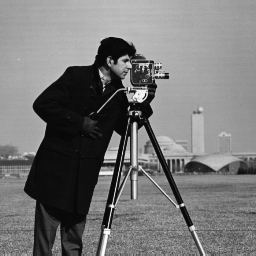

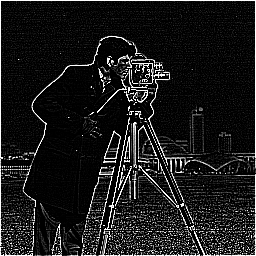

"\nc=np.clip(c,0,255)\nc=np.astype(np.uint8)\nimageio.imwrite('image_sortie_versionc',c)"

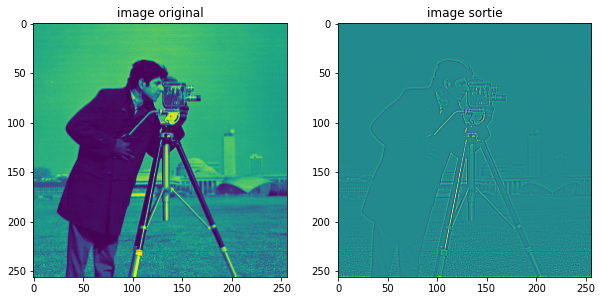

In [ ]:
from scipy import signal
import imageio
#i=imageio.imread('ex1.jpg') sa marche pas
i=cv.imread("cameraman.tif")
#---------------------kernel -------------------------
kernel_moyenn = np.ones((3,3),np.float32)/9
kernel_filtrePbas=np.array([[1,2,1],[2,4,2],[1,2,1]])*(1/16)
kernel_filtrePhaut=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
M=np.array([[2,1,0],[1,1,1],[0,1,2]])

print("i avant",i.shape)
i=cv.cvtColor(i,cv.COLOR_BGR2GRAY)
print("i apres",i.shape)
print(kernel_moyenn.shape)
print(M.shape)
c=signal.convolve2d(i,kernel_filtrePhaut,mode='same',boundary='fill')
#c=signal.convolve2d(i,M,mode='same',boundary='fill')
#cv2_imshow(c)
#mode='full' ou mode='valid'

fg=pl.pyplot.figure(figsize=(10,5))
ax=pl.pyplot.subplot(1,2,1)
ax.set_title("image original")
ax.imshow(i)
cv2_imshow(i)
ax=pl.pyplot.subplot(1,2,2)
ax.set_title("image sortie")
ax.imshow(c)

cv2_imshow(c)
"""
c=np.clip(c,0,255)
c=np.astype(np.uint8)
imageio.imwrite('image_sortie_versionc',c)"""


# ***Moyenne mobile (Signal) avec motif de 5***

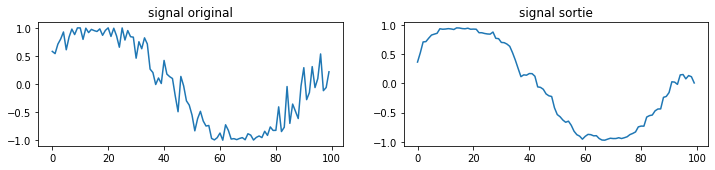

In [ ]:
N=100
f=np.sin(np.linspace(0,2*np.pi,N)+1*np.random.random(N))
g=1/5*np.ones(5)
h=np.convolve(f,g,'same')
#pl.pyplot.plot(h)

fg=pl.pyplot.figure(figsize=(12,5))
ax=pl.pyplot.subplot(2,2,1)
ax.set_title("signal original")
ax.plot(f)

ax=pl.pyplot.subplot(2,2,2)
ax.set_title("signal sortie")
ax.plot(h)

In [ ]:
im1=image.copy()
print("im1.shape",im1.shape)
imgo=im1.ravel()
print("imgo",imgo)
hsorted=sorted(imgo)
print("imgo sort",hsorted)
#print("imgo median",hsorted.filtre_median())
print("imgo shape",imgo.shape)

im1.shape (256, 256, 3)
imgo [156 156 156 ... 113 113 113]
imgo sort [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 

(256, 256)


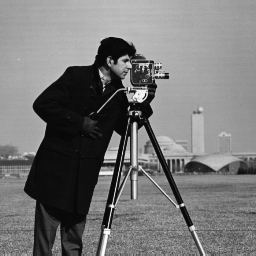

(256, 256)


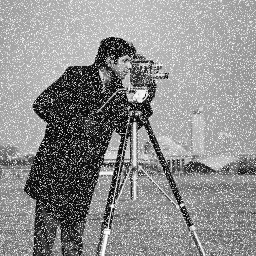

In [ ]:
imgorg=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
gb1=cv.cvtColor(gb,cv.COLOR_BGR2GRAY)
print(imgorg.shape)
cv2_imshow(imgorg)
print(gb1.shape)
cv2_imshow(gb1)

In [ ]:
def minmax(img):
  k=1
  im=img.copy()
  for i in range(k,im.shape[0]-k):
    for j in range(k,im.shape[1]-k):
      s=(np.max(img[i-k:i+k,j-k:j+k])-np.min(img[i-k:i+k,j-k:j+k]))/2
      if im[i][j]<s:
        im[i][j]=np.min(img[i-k:i+k,j-k:j+k])
      else:
        im[i][j]=np.max(img[i-k:i+k,j-k:j+k])
  return im

In [ ]:
def median(img):
  k=1
  im=img.copy()
  for i in range(k,im.shape[0]-k):
    for j in range(k,im.shape[1]-k):
      im[i][j]=np.median(img[i-k:i+k,j-k:j+k])
  return im

********original********


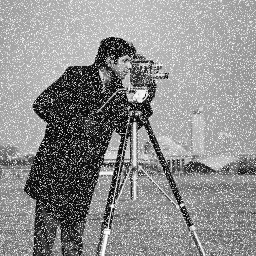

********minmax********


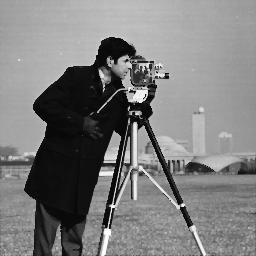

********median********


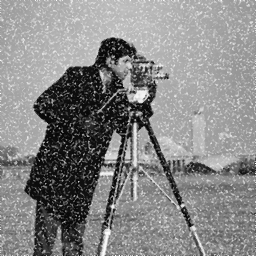

In [ ]:
print("********original********")
cv2_imshow(gb1)
print("********minmax********")
minma=minmax(imgorg)
cv2_imshow(minma)
print("********median********")
media=median(gb1)
cv2_imshow(media)

In [ ]:
t=imgorg[0:5,0:5]
print(t)
di=np.diagonal(t)
dt=np.diagonal(np.transpose(t))
diag=np.concatenate((di,dt))
print(di)
print(dt)
print(diag)
crois=t[2,:]
crois1=t[:,2]
co=np.concatenate((crois,crois1))
print(co)

[[156 159 158 155 158]
 [160 154 157 158 157]
 [156 159 158 155 158]
 [160 154 157 158 157]
 [156 153 155 159 159]]
[156 154 158 158 159]
[156 154 158 158 159]
[156 154 158 158 159 156 154 158 158 159]
[156 159 158 155 158 158 157 158 157 155]


In [ ]:
def medianhybrid(img):
  k=5
  im=img.copy()
  for i in range(k,im.shape[0]-k):
    for j in range(k,im.shape[1]-k):
      t=img[i-k:i+k,j-k:j+k]
      di=np.diagonal(t)
      dt=np.diagonal(np.transpose(t))
      diag=np.concatenate((di,dt))
      m1=np.median(diag)
      crois=t[2,:]
      crois1=t[:,2]
      co=np.concatenate((crois,crois1))
      m2=np.median(co)
      im[i][j]=np.median([m1,m2,t[2,2]])
  return im

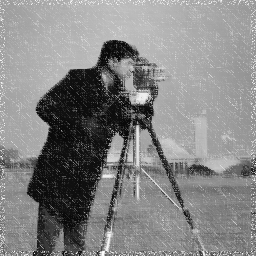

In [ ]:
mediahy=medianhybrid(gb1)
cv2_imshow(mediahy)

In [ ]:
def nagao(img):
  k=2
  im=img.copy()
  for i in range(k,im.shape[0]-k):
    for j in range(k,im.shape[1]-k):
      t=img[i-k:i+k,j-k:j+k]
      listd=[]
      listm=[]
      listv=[]
      d1=t[:3,:3]
      listd.append(d1)
      listm.append(np.mean(d1))
      listv.append(np.var(d1))
      d2=t[:3,1:4]
      listd.append(d2)
      listm.append(np.mean(d2))
      listv.append(np.var(d2))
      d3=t[:3,-3:]
      listd.append(d3)
      listm.append(np.mean(d3))
      listv.append(np.var(d3))
      d4=t[1:4,:3]
      listd.append(d4)
      listm.append(np.mean(d4))
      listv.append(np.var(d4))
      d5=t[1:4,1:4]
      listd.append(d5)
      listm.append(np.mean(d5))
      listv.append(np.var(d5))
      d6=t[1:4,-3:]
      listd.append(d6)
      listm.append(np.mean(d6))
      listv.append(np.var(d6))
      d7=t[2:5,:3]
      listd.append(d7)
      listm.append(np.mean(d7))
      listv.append(np.var(d7))
      d8=t[2:5,1:4]
      listd.append(d8)
      listm.append(np.mean(d8))
      listv.append(np.var(d8))
      d9=t[2:5,2:5]
      listd.append(d9)
      listm.append(np.mean(d9))
      listv.append(np.var(d9))
      ds=0
      vv=np.min(listv)
      for i1 in range(0,len(listv)):
        if listv[i1]==vv:
          ds=i1
      im[i][j]=listm[ds]
  return im

In [ ]:
def nagao2(img):
  k=2
  im=img.copy()
  for i in range(k,im.shape[0]-k):
    for j in range(k,im.shape[1]-k):
      t=img[i-k:i+k,j-k:j+k]
      d1,d2,d3,d4,d5=t[:3,:3],t[:3,1:4],t[:3,-3:],t[1:4,:3],t[1:4,1:4]
      d6,d7,d8,d9=t[1:4,-3:],t[2:5,:3],t[2:5,1:4],t[2:5,2:5]
      domaines=[d1,d2,d3,d4,d5,d6,d7,d8,d9]
      minvar=np.var(d1)
      moy=np.mean(d1)
      ds=0
      for d in domaines:
        v=np.var(d)
        if v < minvar:
          minvar=v
          moy=np.mean(d)
      im[i][j]=moy
  return im

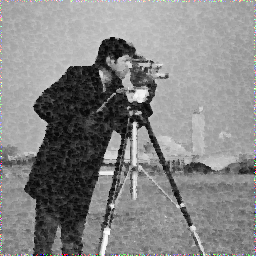

***********original***************


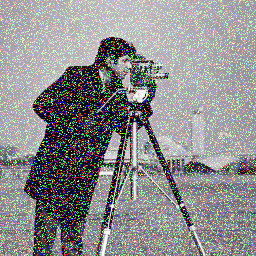

In [ ]:
ng=nagao2(gb)
cv2_imshow(ng)
print("***********original***************")
cv2_imshow(gb)

# Detection contour

In [ ]:
import math as mt
import numpy as np
import cv2 as cv
import matplotlib as pl
from google.colab.patches import cv2_imshow

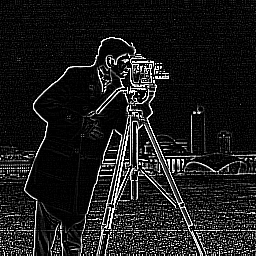

l'utilsation du valeur absolu


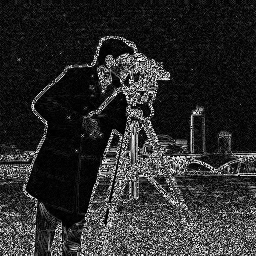

In [ ]:
image=cv.imread(r"cameraman.tif",0)
lap=cv.Laplacian(image,cv.CV_64F,ksize=3)
lapabsolu=np.uint8(np.absolute(lap))
cv2_imshow(lap)
print("l'utilsation du valeur absolu")
cv2_imshow(lapabsolu)

***Laplacien de la gaussienne***

In [ ]:
!pip install pillow
from PIL import Image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
ImagePil=Image.open('cameraman.tif')

In [ ]:
imagev2=cv.imread("cameraman.tif",0)
ImagePillog=Image.open('cameraman.tif')
def LG(i,j,s):
  rc=i**2+j**2
  return 1/(mt.pi*(s**4))*(1-rc/(2*(s**2)))*mt.exp(-rc/(2**(s**2)))
Lg=LG(1,1,0.625)
print(Lg)

-0.7077759442128797


In [ ]:
def LG1(i,j,segma=0.625):
  r2=i**2+j**2
  return (1-r2/(2*segma**2))/(np.pi*segma**4)*np.exp(-r2/(2*segma**2))
#return ((r2-2*segma*2)/segma4)*np.exp(-r2/(2*segma*2))

In [ ]:
def masquegaus(sz):
  h=np.zeros((sz,sz))
  for i in range(sz):
    for j in range(sz):
      h[i][j]=LG1((i-sz//2),(j - sz//2))
  return h

In [ ]:
masqgaus=masquegaus(5)
print(masqgaus)

[[-6.88377290e-04 -1.87171247e-02 -5.13617162e-02 -1.87171247e-02
  -6.88377290e-04]
 [-1.87171247e-02 -2.51571120e-01 -1.62401917e-01 -2.51571120e-01
  -1.87171247e-02]
 [-5.13617162e-02 -1.62401917e-01  2.08607567e+00 -1.62401917e-01
  -5.13617162e-02]
 [-1.87171247e-02 -2.51571120e-01 -1.62401917e-01 -2.51571120e-01
  -1.87171247e-02]
 [-6.88377290e-04 -1.87171247e-02 -5.13617162e-02 -1.87171247e-02
  -6.88377290e-04]]


In [ ]:
def conv_gauss1(image, m):
  x,y=image.shape[0],image.shape[1]
  im=np.zeros((x,y),float)
  v=-m.shape[0]//2
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      s=0
      for i1 in range(-v,v+1):
        for j1 in range(-v,v+1):
        #im=np.multiply(m,image[i-2,j+2])
          if i-i1 > 0 and j-j1 > 0:
            s=s+(image[i-i1][j-j1]*m[i1,j1])
      im[i][j]=s
  return im

In [ ]:
# Apply a mask to an image.
def conv_gauss(img, mask):
  # get image and mask size
  width, height = img.size # 400x500
  k_width, k_height = mask.shape # 5x5

  # 2D representation to facilitate the way to access to the neighbors
  data = np.array(img.getdata()).reshape((width, height), order='F')

  # create a new image for the output
  out_img = Image.new(mode = img.mode, size = img.size)
  out_data = np.zeros((width, height))

  # i and j paddings
  i_pad = k_width // 2
  j_pad = k_height // 2

  # loop through pixels
  for i in range(i_pad, width - i_pad):
    for j in range(j_pad, height - j_pad):
      neighbors = data[(i - i_pad):(i + i_pad + 1), (j - j_pad):(j + j_pad + 1)]

      # multiply two matrices
      mult_matrix = np.multiply(neighbors, mask)

      # calculate the sum
      out_data[i, j] = np.sum(mult_matrix)


  # put image data
  out_img.putdata(out_data.reshape((width * height), order='F'))

  return out_img

In [ ]:
print(conv_gauss(ImagePillog,masqgaus))

<PIL.Image.Image image mode=L size=256x256 at 0x7FF4D9AAC350>


In [ ]:
def lap_contour(image,mask):
  img=conv_gauss1(image,mask)
  n,m=image.shape[0],image.shape[1]
  img_contour=np.zeros((n,m))
  for i in range(0,n-1):
    for j in range(0,m-1):
      f=img[i,j]*img[i,j+1]
      if f < 0.0:
        img_contour[i,j]=1
      if img[i,j]*img[i+1,j]<0.0:
        img_contour[i,j]=1
  return img_contour

msgc=conv_gauss(image,5)
conv_gauss(ImagePil,msgc)

***Canny***

In [ ]:
ImagePil=Image.open('cameraman.tif')

In [ ]:
# Apply a mask to an image.
def apply_mask(img, mask):
  # get image and mask size
  width, height = img.size # 400x500
  k_width, k_height = mask.shape # 5x5

  # 2D representation to facilitate the way to access to the neighbors
  data = np.array(img.getdata()).reshape((width, height), order='F')

  # create a new image for the output
  out_img = Image.new(mode = img.mode, size = img.size)
  out_data = np.zeros((width, height))

  # i and j paddings
  i_pad = k_width // 2
  j_pad = k_height // 2

  # loop through pixels
  for i in range(i_pad, width - i_pad):
    for j in range(j_pad, height - j_pad):
      neighbors = data[(i - i_pad):(i + i_pad + 1), (j - j_pad):(j + j_pad + 1)]

      # multiply two matrices
      mult_matrix = np.multiply(neighbors, mask)

      # calculate the sum
      out_data[i, j] = np.sum(mult_matrix)


  # put image data
  out_img.putdata(out_data.reshape((width * height), order='F'))

  return out_img

In [ ]:
def h(x,y,segma=0.625):
  return 1/(2*(segma**2)*(np.pi))*np.exp(-(x**2+y**2)/(2*(segma**2)))

In [ ]:
def LG1(i,j,segma=0.625):
  r2=i*2+j*2
  return (1-r2/(2*segma**2))/(np.pi*segma**4)*np.exp(-r2/(2*segma**2))
#return ((r2-2*segma*2)/segma4)*np.exp(-r2/(2*segma*2))

In [ ]:
def masquegausCanny(sz):
  h=np.zeros((sz,sz))
  for i in range(sz):
    for j in range(sz):
      h[i][j]=LG1((i-sz//2),(j - sz//2))
  return h

In [ ]:
mgCanny=masquegausCanny(5)
print(mgCanny)

[[ 6.56556135e+05  3.91950664e+04  2.13633437e+03  9.60669338e+01
   2.08607567e+00]
 [ 3.91950664e+04  2.13633437e+03  9.60669338e+01  2.08607567e+00
  -2.51571120e-01]
 [ 2.13633437e+03  9.60669338e+01  2.08607567e+00 -2.51571120e-01
  -5.13617162e-02]
 [ 9.60669338e+01  2.08607567e+00 -2.51571120e-01 -5.13617162e-02
  -6.43761350e-03]
 [ 2.08607567e+00 -2.51571120e-01 -5.13617162e-02 -6.43761350e-03
  -6.88377290e-04]]


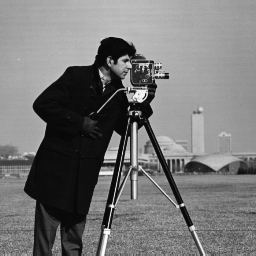

In [ ]:
ImagePil

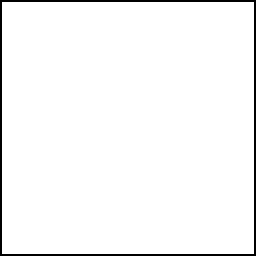

In [ ]:
msgc=masquegausCanny(5)
k=np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32)
apply_mask(ImagePil,msgc)

In [ ]:
def conv_gaussCanny(image, m):
  x,y=image.shape[0],image.shape[1]
  im=np.zeros((x,y),float)
  v=-m.shape[0]//2
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      s=0
      for i1 in range(-v,v+1):
        for j1 in range(-v,v+1):
        #im=np.multiply(m,image[i-2,j+2])
          if i-i1 > 0 and j-j1 > 0:
            s=s+(image[i-i1][j-j1]*m[i1,j1])
      im[i][j]=s
  return im

In [ ]:
def derv_h(image):
  kernelx=np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32)
  im=image.copy()
  Gx=np.zeros(shape=im.shape,dtype=im.dtype)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      Gx[i,j]=np.abs(np.sum(np.multiply(kernelx, im[i:i+2,j])))
  return Gx

In [ ]:
def derv_v(image):
  kernely=np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32)
  im=image.copy()
  Gy=np.zeros(shape=im.shape,dtype=im.dtype)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
     Gy[i,j]=np.abs(np.sum(np.multiply(kernely, im[i,j:j+2])))
  return Gy

In [ ]:
def derv_vh(image):
  kernelx=np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32)
  kernely=np.array([[-1,0,1],[-2,0,2],[-1,0,1]],np.float32)
  im=image.copy()
  Gx=np.zeros(shape=im.shape,dtype=im.dtype)
  Gy=np.zeros(shape=im.shape,dtype=im.dtype)
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      Gx[i,j]=np.abs(np.sum(np.multiply(kernelx, im[i:i+2,j])))
      Gy[i,j]=np.abs(np.sum(np.multiply(kernely, im[i,j:j+2])))
      G=(Gx+Gy)/2
  return G

In [ ]:
pl.pyplot.figure(figsize=(10,10))
pl.pyplot.subplot(1,3,1)
pl.pyplot.imshow(derv_h(imagev2),cmap='gray')
pl.pyplot.subplot(1,3,2)
pl.pyplot.imshow(derv_v(imagev2),cmap='gray')
pl.pyplot.subplot(1,3,3)
pl.pyplot.imshow(derv_vh(imagev2),cmap='gray')

In [ ]:
def amplitude_grad(image):
  return np.str((derv_v(image)**2)+(derv_h(image)**2))

In [ ]:
def orientation_grad(image):
  dh=derv_h(image)
  try:
    dh=0
  except:
    pass
  return np.arctan(derv_v(image)/dh)

In [ ]:
def nonmax(image):
  im=image.copy()
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      if(im[i:i+1,j] or im[i,j:j+1] < im[i,j]):
        im[i,j]=0
  return im

In [ ]:
def seuillage_hysteresis(image,s1):
  im=image.copy()
  s2=2*s1
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
      if(amplitude_grad(im)>s1):
        pass


***Canny opencv***

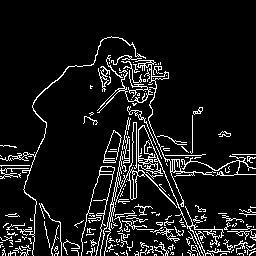

In [ ]:
canny=cv.Canny(imagev2,100,200)
cv2_imshow(canny)

***Sobel opencv***

x


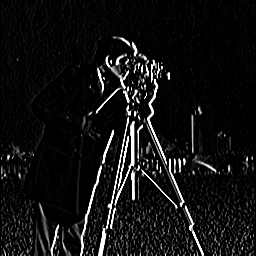

y


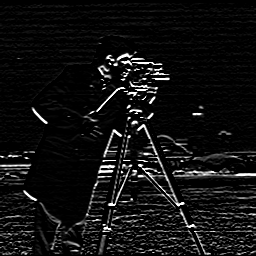

sobel


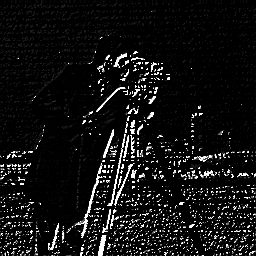

In [ ]:
sobx=cv.Sobel(imagev2,cv.CV_64F,1,0)
soby=cv.Sobel(imagev2,cv.CV_64F,0,1)
sobabsolux=np.uint8(np.absolute(sobx))
sobabsoluy=np.uint8(np.absolute(soby))
com_sob=cv.bitwise_or(sobx,soby)
print("x")
cv2_imshow(sobx)
print("y")
cv2_imshow(soby)
print("sobel")
cv2_imshow(com_sob)

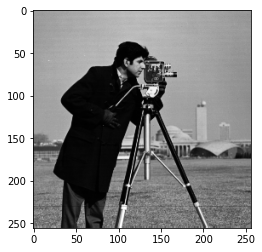

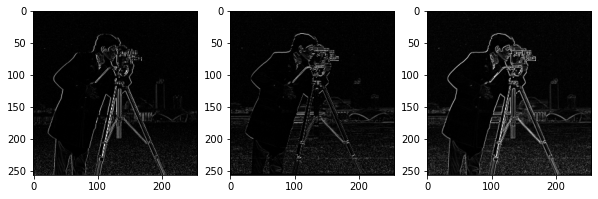

In [ ]:
im=cv.imread("cameraman.tif",0)
#im=cv.resize(im, (300,300))
pl.pyplot.imshow(im,cmap='gray')

kernelx=np.array([-1,1])
kernely=np.array([-1,1])

Gx=np.zeros(shape=im.shape,dtype=im.dtype)
Gy=np.zeros(shape=im.shape,dtype=im.dtype)


for i in range(im.shape[0]):
  for j in range(im.shape[1]):
    Gx[i,j]=np.abs(np.sum(np.multiply(kernelx, im[i:i+2,j])))
    Gy[i,j]=np.abs(np.sum(np.multiply(kernely, im[i,j:j+2])))

G=(Gx+Gy)/2

pl.pyplot.figure(figsize=(10,10))
pl.pyplot.subplot(1,3,1)
pl.pyplot.imshow(Gy,cmap='gray')
pl.pyplot.subplot(1,3,2)
pl.pyplot.imshow(Gx,cmap='gray')
pl.pyplot.subplot(1,3,3)
pl.pyplot.imshow(G,cmap='gray')

# Feature detection

# ***La transformée de Hough***

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[[ 335 1120  480 1122]]
[[1573 1002 1663 1046]]
[[1099  784 1100  785]]
[[   0 1043   81 1011]]
[[ 407 1246  505 1198]]
[[1641  815 1889  762]]
[[1441  986 1558  929]]
[[1124  823 1164  823]]
[[1255  887 1291  873]]
[[1836  724 1836  730]]
[[2144  986 2168  982]]
[[1014  768 1040  774]]
[[1554 1047 1731  976]]
[[1707  747 1883  747]]
[[ 746 1074  836 1024]]
[[885 923 988 873]]
[[1519  888 1519  888]]
[[1814  836 1891  774]]
[[440 930 676 854]]
[[968 818 974 817]]
[[ 169 1400  299 1328]]
[[1160  857 1167 1007]]
[[1455  993 1564  928]]
[[  14 1299   16 1244]]
[[1444  918 1676  943]]
[[1218  825 1301  842]]
[[1726 1010 1739  977]]
[[1826  771 2106  810]]
[[ 386 1158  710  845]]
[[744 815 753 814]]
[[1125  834 1229  846]]
[[1864  879 2145  987]]
[[1477 1005 1721  971]]
[[1885  796 2122  833]]
[[1704 1107 1817 1167]]
[[ 638 1121  690 1095]]
[[ 707 1093  707 1093]]
[[1986  902 1996  928]]
[[160 820 187 825]]
[[ 278

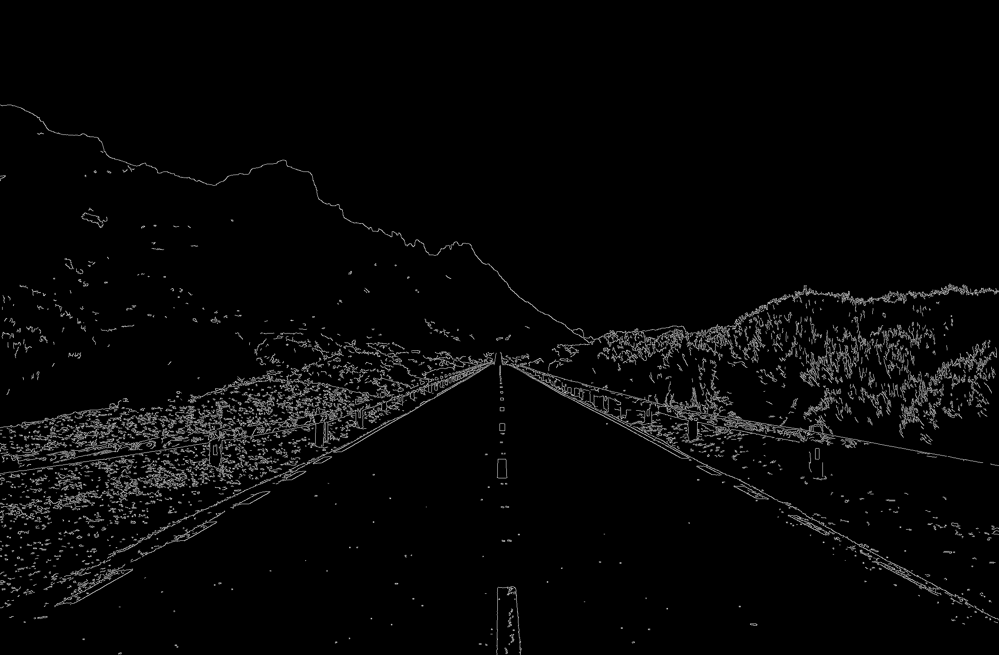

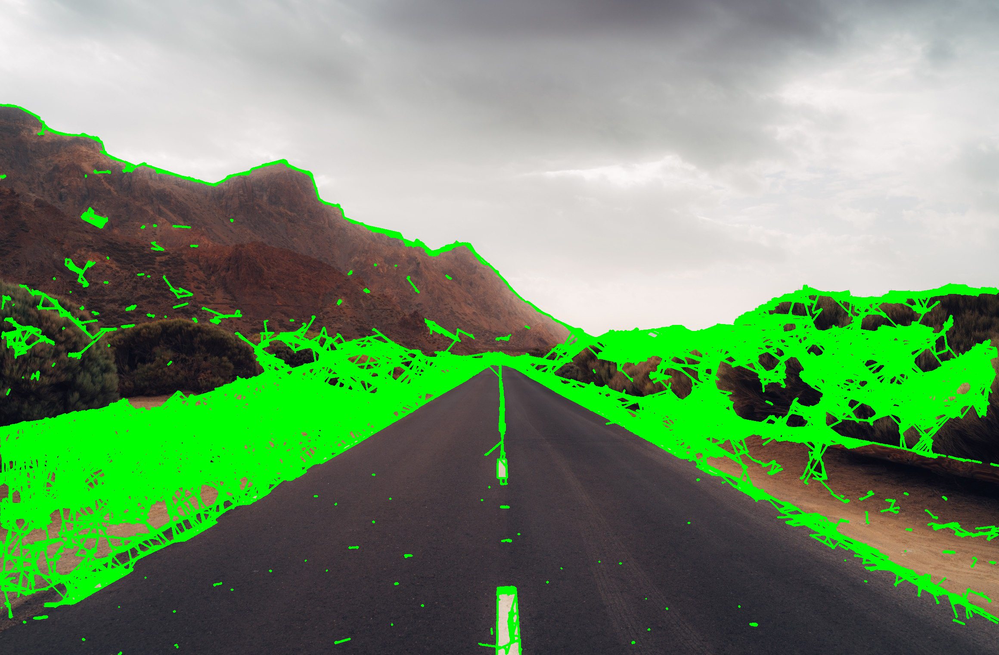

In [ ]:
im1=cv.imread("lines.jpg")
img_gray=cv.cvtColor(im1,cv.COLOR_BGR2GRAY)
canny=cv.Canny(img_gray,100,200)
lines=cv.HoughLinesP(canny,1,np.pi/180,10,maxLineGap=30)
for line in lines:
  print(line)
  x1,y1,x2,y2=line[0]
  cv.line(im1,(x1,y1),(x2,y2),(0,255),3)

cv2_imshow(canny)
cv2_imshow(im1)

In [ ]:
v=cv.VideoCapture("https://www.youtube.com/watch?v=B07nz5Rh-cA")
while True:
  ret,origine_frame=v.read()
  if not ret:
    v=cv.VideoCapture("https://www.youtube.com/watch?v=B07nz5Rh-cA")
    continue
frame=cv.GaussianBlur(origine_frame,(5,5),0)
hs=cv.cvtColor(im1,cv.COLOR_BGR2GRAY)
low_yellow=[18,94,140]
up_yellow=[48,255,255]
mask=cv.inRange(hs,low_yellow,up_yellow)
canny=cv.Canny(mask,100,200)

lines=cv.HoughLinesP(canny,1,np.pi/180,50,maxLineGap=50)
if lines is not None:
  for line in lines:
    x1,y1,x2,y2=line[0]
    cv.line(im1,(x1,y1),(x2,y2),(0,255,0),5)

cv2_imshow(frame)
cv2_imshow(canny)
cv2_imshow(mask)

v.release()
cv.destroyAllWindows()

[[[406.5 140.5  94. ]
  [199.5 139.5  88.8]]]
********transformation**********
[[[406 140  94]
  [200 140  89]]]


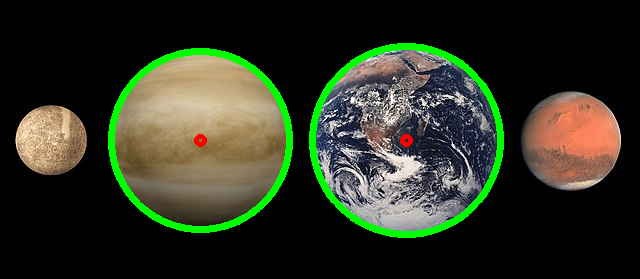

In [ ]:
planets=cv.imread("planet.jpg")
gray_planet=cv.cvtColor(planets,cv.COLOR_BGR2GRAY)
imgplanet_median=cv.medianBlur(gray_planet,5)
cimgp=cv.cvtColor(imgplanet_median , cv.COLOR_GRAY2BGR)

circles=cv.HoughCircles(imgplanet_median,cv.HOUGH_GRADIENT,1,180,param1=180,param2=30,minRadius=0,maxRadius=0)
print(circles)
print("********transformation**********")
circles=np.uint16(np.around(circles))
print(circles)

for i in circles[0,:]:
  cv.circle(planets,(i[0],i[1]),i[2],(0,255,0),6)
  cv.circle(planets,(i[0],i[1]),4,(0,0,255),3)

cv2_imshow(planets)

# ***harris corner detector***

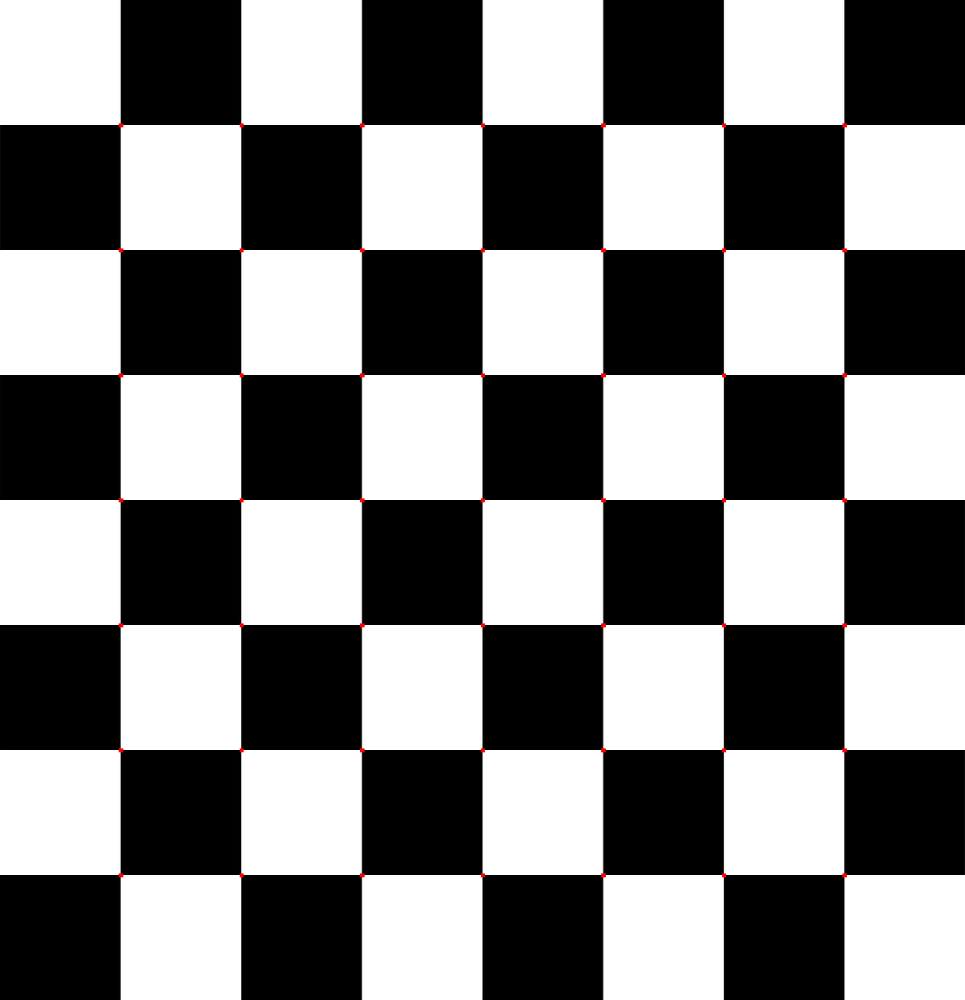

In [ ]:
chet=cv.imread("ch.png")
gray_chet=cv.cvtColor(chet,cv.COLOR_BGR2GRAY)

gray_chet=np.float32(gray_chet)
haris=cv.cornerHarris(gray_chet,2,3,0.04)
haris=cv.dilate(haris,None)
chet[haris > 0.01 * haris.max()]=[0,0,255]
cv2_imshow(chet)

# ***SIFT***

In [ ]:
import numpy as np
import cv2 as cv
cv.__version__

'4.1.2'

In [ ]:
imgsift = cv.imread('immeuble.jpeg')
gray= cv.cvtColor(imgsift,cv.COLOR_BGR2GRAY)
sift = cv.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None)
imgsift=cv.drawKeypoints(gray,kp,imgsift)
cv.imwrite('sift_keypoints.jpg',imgsift)

imgsift=cv.drawKeypoints(gray,kp,imgsift,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv.imwrite('sift_keypoints.jpg',imgsift)

sift = cv.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(gray,None)
imgssift=cv.drawKeypoints(gray,kp,imgssift)
cv.imwrite('sift_keypoints.jpg',imgssift)

# ***Histogram of Oriented Gradients ( HOG )***

(3780,)


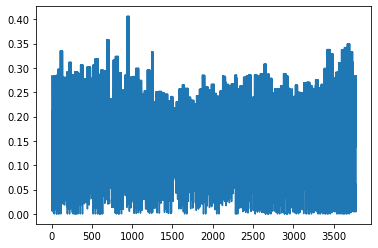

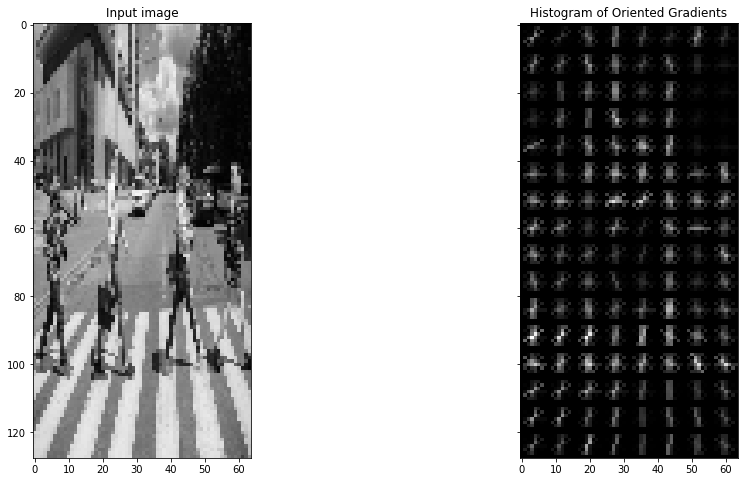

In [ ]:
import math as mt
import numpy as np
import cv2 as cv
import matplotlib as pl
from skimage.feature import hog
from skimage import exposure
from google.colab.patches import cv2_imshow

ima1='pieton.jpeg'
pieton1=cv.imread(ima1,0)

resized_img1=cv.resize(pieton1,(64,128))
fd, hog_image = hog(resized_img1, orientations=9, pixels_per_cell=(8, 8),
                    cells_per_block=(2, 2), visualize=True, multichannel=False)

print(fd.shape)
pl.pyplot.plot(fd)

fig, (ax1, ax2) = pl.pyplot.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)

ax1.imshow(resized_img, cmap=pl.cm.gray)
ax1.set_title('Input image')


ax2.imshow(hog_image, cmap=pl.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')

pl.pyplot.show()

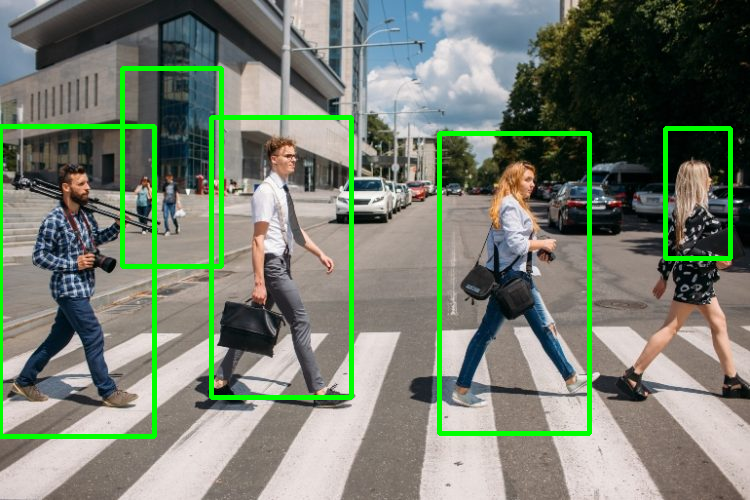

In [ ]:
ima='pieton.jpeg'
pieton=cv.imread(ima)

hog=cv.HOGDescriptor()
hog.setSVMDetector(cv.HOGDescriptor_getDefaultPeopleDetector())

(bd_box,w)=hog.detectMultiScale(pieton,winStride=(3,3),padding=(4,4),scale=1.05)

for (x,y,w,h) in bd_box:
  cv.rectangle(pieton,(x,y),(x+w,y+h),(0,255,0),4)
size=len(ima)
new_img=ima[:size-4]
new_img=new_img+'_detect.jpg'

cv2_imshow(pieton)

# Segmentation kmeans

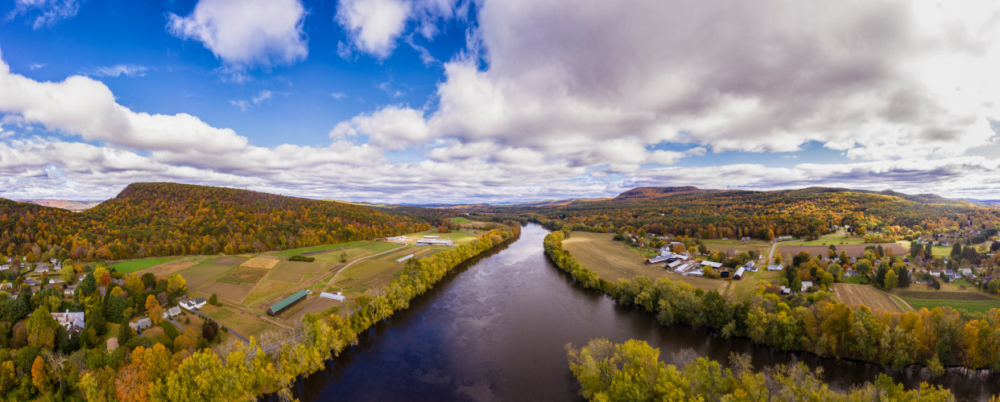

In [ ]:
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow

image=cv.imread("n1.jpg")
cv2_imshow(image)

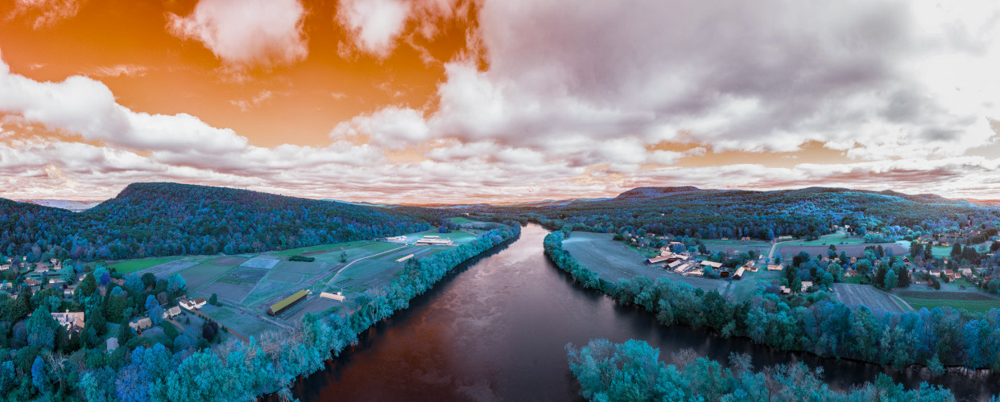

In [ ]:
imggray=cv.cvtColor(image,cv.COLOR_BGR2RGB)
cv2_imshow(imggray)

In [ ]:
imggray.shape

(500, 1242, 3)

In [ ]:
px=imggray.reshape((-1,3))
pxf=np.float32(px)
print(pxf.shape)

(621000, 3)


In [ ]:
critaire=(cv.TermCriteria_EPS+cv.TermCriteria_MAX_ITER,100,0.2)

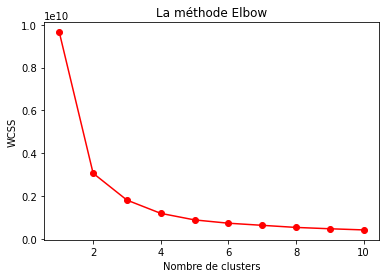

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 0)
    kmeans.fit(pxf)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss,marker='o',c="red")
plt.title('La méthode Elbow')
plt.xlabel('Nombre de clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
k=4
_,labels,(centre)=cv.kmeans(pxf,k,None,critaire,10,cv.KMEANS_RANDOM_CENTERS)
centre=np.uint8(centre)
labels=labels.flatten()

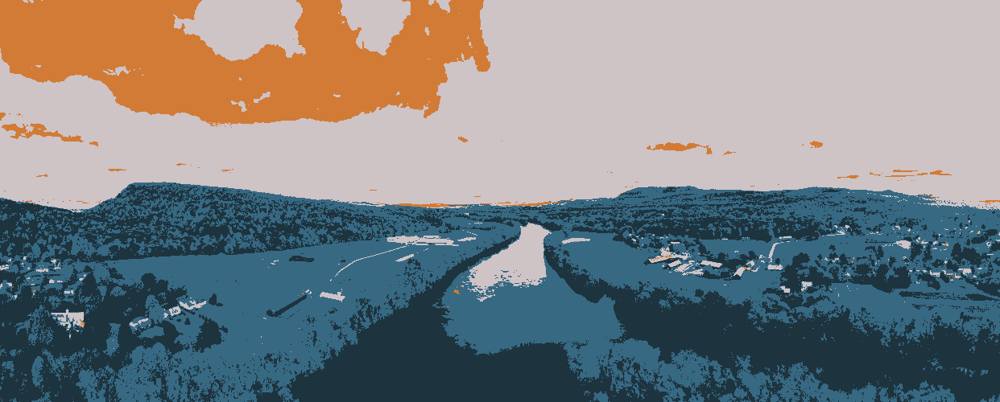

In [ ]:
segmentation_img=centre[labels]
segmentation_img=segmentation_img.reshape(image.shape)
"""plt.imshow(segmentation_img)
plt.show()"""
cv2_imshow(segmentation_img)

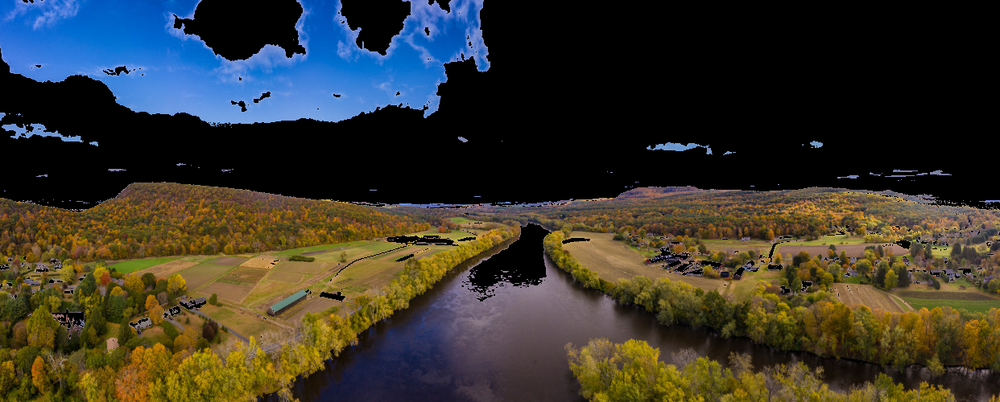

In [ ]:
from pyparsing.core import Or
mask_img=np.copy(image)
mask_img=mask_img.reshape((-1,3))
class1 = 0
mask_img[labels == class1]=[0,0,0]
mask_img=mask_img.reshape(image.shape)
cv2_imshow(mask_img)
k=cv.waitKey(5000)

if k==27:
  cv.destroyAllWindows()
elif k== ord('s'):
  cv.imwrite('fauxcluster.jpg',image)
  cv.destroyAllWindows()

Camera Capture

Using a webcam to capture images for processing on the runtime.

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

<IPython.core.display.Javascript object>

NotAllowedError: Permission denied


# Morphologie mathématique

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib as pl
from google.colab.patches import cv2_imshow

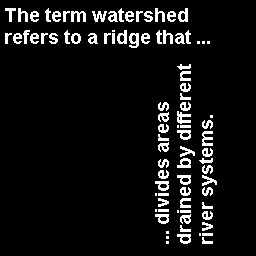

In [ ]:
image=cv.imread(r"text.png",0)
cv2_imshow(image)

In [ ]:
image.shape

(256, 256)

In [ ]:
image[image==255]=1
image[image==1]

In [ ]:
M0= np.ones((3,3))
M=np.array([[1,1,0],[1,1,1],[0,1,1]])
M0*M

array([[1., 1., 0.],
       [1., 1., 1.],
       [0., 1., 1.]])

In [ ]:
M[1][1]

8

In [ ]:
def dilatation(img,estruct):
  im=img.copy()
  img_dimn,img_dimm=img.shape
  dimen=estruct.shape[0]
  dimem=estruct.shape[1]
  for i in range(dimen//2,img_dimn-dimen//2):
    for j in range(dimem//2,img_dimn-dimem//2):
      I=img[i-dimen//2:i+dimem//2+1,j-dimen//2:j+dimem//2+1]
      prod=I*estruct
      imax=np.max(prod)
      im[i][j]=imax
  return im

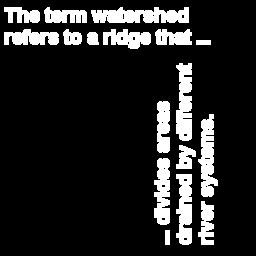

In [ ]:
img_dilate=dilatation(image,np.ones((3,3)))
cv2_imshow(img_dilate)

In [ ]:
def erosion(img,estruct):
  im=img.copy()
  img_dimn,img_dimm=img.shape
  dimen=estruct.shape[0]
  dimem=estruct.shape[1]
  for i in range(dimen//2,img_dimn-dimen//2):
    for j in range(dimem//2,img_dimn-dimem//2):
      I=img[i-dimen//2:i+dimem//2+1,j-dimen//2:j+dimem//2+1]
      prod=I*estruct
      L=[prod[ii,jj] for ii in range(dimen) for jj in range(dimem) if(estruct[ii,jj]!=0)]
      imin=np.min(L)
      im[i][j]=imin
      """
      if(prod[i][j]==0):
        im[i][j]=prod"""
  return im

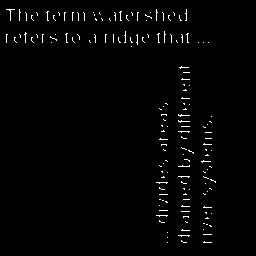

In [ ]:
img_erosion=erosion(image,M)
cv2_imshow(img_erosion)

***érosion et dilatation,OPEN CV***

In [ ]:
elem_struct=np.array([[1,1,0],[1,1,1],[0,1,1]],np.uint8)
elem_struct

array([[1, 1, 0],
       [1, 1, 1],
       [0, 1, 1]], dtype=uint8)

*érosion*

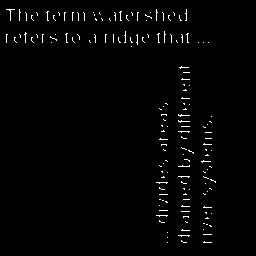

In [ ]:
ero=cv.erode(image,elem_struct,iterations=1)
cv2_imshow(ero)

*dilatation*

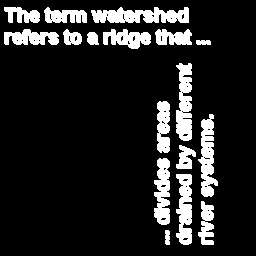

In [ ]:
dilat=cv.dilate(image,elem_struct)
cv2_imshow(dilat)